# <center>Health Insurance EDA


# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import display
%matplotlib inline

# Import Datasets

In [2]:
# Import training data
df_train = pd.read_csv('Train.csv') 

# Import testing data
df_test = pd.read_csv('Test.csv')


# Reading and Exploring

In [3]:
# JOIN TRAIN AND TEST DATAFRAME
df = pd.concat([df_train,df_test]).reset_index(drop=True)
df.sample(10)

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
20355,20356,C15,1621,Rented,Individual,36,36,No,X1,4.0,1.0,2,13904.0,0.0
4178,4179,C6,844,Rented,Individual,52,52,No,X3,2.0,1.0,21,17724.0,0.0
20117,20118,C8,453,Owned,Joint,71,66,Yes,X2,13.0,1.0,12,29538.0,0.0
34620,34621,C2,1288,Rented,Individual,75,75,No,X4,14+,3.0,3,20670.0,0.0
25713,25714,C7,4773,Owned,Joint,75,68,Yes,X1,5.0,3.0,21,31228.4,0.0
15454,15455,C21,5202,Rented,Individual,20,20,No,NaN,NaN,NaN,14,5936.0,0.0
14631,14632,C19,647,Rented,Individual,33,33,No,X4,1.0,1.0,16,8184.0,0.0
56445,56446,C2,5664,Rented,Individual,75,75,No,X4,NaN,NaN,22,28272.0,NaN
34788,34789,C4,1635,Owned,Individual,43,43,No,X3,2.0,1.0,2,9056.0,0.0
7692,7693,C1,6,Rented,Joint,61,42,No,X4,9.0,2.0,19,26169.0,1.0


In [4]:
df.columns

Index(['ID', 'City_Code', 'Region_Code', 'Accomodation_Type',
       'Reco_Insurance_Type', 'Upper_Age', 'Lower_Age', 'Is_Spouse',
       'Health Indicator', 'Holding_Policy_Duration', 'Holding_Policy_Type',
       'Reco_Policy_Cat', 'Reco_Policy_Premium', 'Response'],
      dtype='object')

In [5]:
# RENAME COLUMN
df = df.rename(columns={'Health Indicator': 'health_indicator'})

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72687 entries, 0 to 72686
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       72687 non-null  int64  
 1   City_Code                72687 non-null  object 
 2   Region_Code              72687 non-null  int64  
 3   Accomodation_Type        72687 non-null  object 
 4   Reco_Insurance_Type      72687 non-null  object 
 5   Upper_Age                72687 non-null  int64  
 6   Lower_Age                72687 non-null  int64  
 7   Is_Spouse                72687 non-null  object 
 8   health_indicator         55969 non-null  object 
 9   Holding_Policy_Duration  43833 non-null  object 
 10  Holding_Policy_Type      43833 non-null  float64
 11  Reco_Policy_Cat          72687 non-null  int64  
 12  Reco_Policy_Premium      72687 non-null  float64
 13  Response                 50882 non-null  float64
dtypes: float64(3), int64(5

In [7]:
df.describe()

,ID,Region_Code,Upper_Age,Lower_Age,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
count,72687.000000,72687.000000,72687.000000,72687.000000,43833.000000,72687.000000,72687.000000,50882.000000
mean,36344.000000,1737.573101,44.862713,42.741632,2.439486,15.122140,14194.856472,0.239947
std,20983.073845,1428.388402,17.293563,17.304194,1.029450,6.329295,6562.564815,0.427055
min,1.000000,1.000000,18.000000,16.000000,1.000000,1.000000,2152.000000,0.000000
25%,18172.500000,527.000000,28.000000,27.000000,1.000000,12.000000,9254.000000,0.000000
50%,36344.000000,1391.000000,44.000000,40.000000,3.000000,17.000000,13200.000000,0.000000
75%,54515.500000,2681.000000,59.000000,57.000000,3.000000,20.000000,18144.000000,0.000000
max,72687.000000,6194.000000,75.000000,75.000000,4.000000,22.000000,43776.000000,1.000000


In [8]:
# CHECKING FOR NULL VALUES
pd.isna(df).sum()

ID                             0
City_Code                      0
Region_Code                    0
Accomodation_Type              0
Reco_Insurance_Type            0
Upper_Age                      0
Lower_Age                      0
Is_Spouse                      0
health_indicator           16718
Holding_Policy_Duration    28854
Holding_Policy_Type        28854
Reco_Policy_Cat                0
Reco_Policy_Premium            0
Response                   21805
dtype: int64

In [9]:
df = df.dropna().reset_index()

# Univariate Analysis

In [10]:
fig = px.pie(names='Is_Spouse',
 data_frame=df,color_discrete_sequence=['#DC7633','#F5B041'],
 color='Is_Spouse', title=' Fig.1 Married Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [11]:
fig = px.pie(names='Reco_Insurance_Type',
 data_frame=df,color_discrete_sequence=['#DC7633','#F5B041'],
 color='Reco_Insurance_Type', title='Recommended Insurance Type',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [12]:
fig = px.pie(names='health_indicator',
 data_frame=df,
 color='health_indicator', title='Health Indicator of Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [13]:
fig = px.pie(names='Holding_Policy_Type',
 data_frame=df,
 color='Holding_Policy_Type', title='Holding Policy Type',hole=.3)

fig.update_traces(textposition='inside', textinfo='percent+label')

In [14]:
fig = px.pie(names='Holding_Policy_Duration',
 data_frame=df,
 color='Holding_Policy_Duration', title='Holding Policy Duration of Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

# <center>From the plots we can deduce
1.  Most respondents live in City_code 'C1'
2.  Most respondents are home owners
3.  Most respondents are not married
4.  Most respondents are recommended individual health insurance type
5.  Most respondents have health indicator X1
6.  Most respondents are new customer(Holding_Policy_Duration<5 is higher)


# Correlation of Data

<AxesSubplot:>

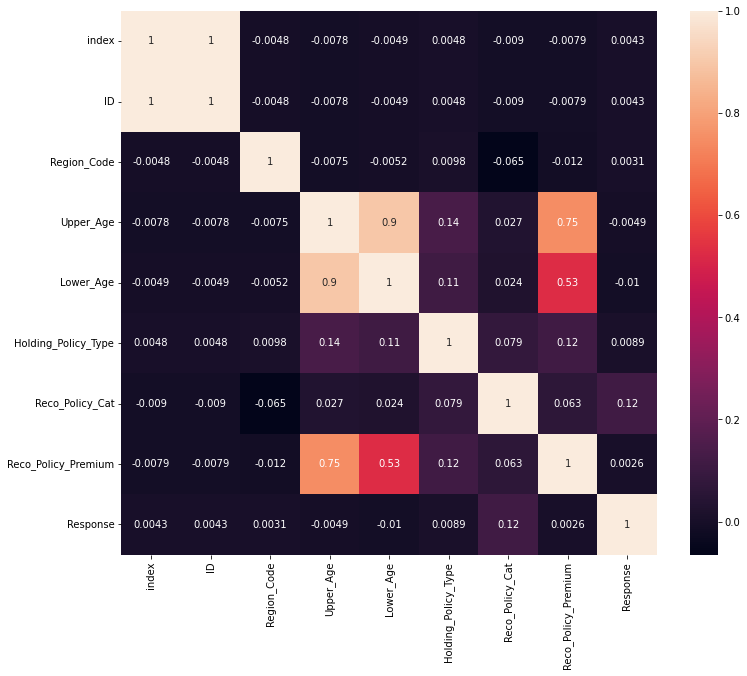

In [15]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),annot=True)

# <center>From the correlation plot we can observe a case of multicollinearity between Upper_Age and Lower_Age

# Recommendation:
### Before model training Lower_Age can be dropped as Upper_age already has high correlation with annual premium
### We will an ANOVA Test to extrapolate correlation between categorical variable with Annual Premium

In [16]:
fig = px.box(x='Reco_Policy_Premium',
 data_frame=df,
 title=' Annual Recommended Premium')
fig.show()

We can investigate customer who have to pay upper fence of 32,000

In [19]:
df[df.Reco_Policy_Premium>42000]

,index,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,health_indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
2617,5826,5827,C1,1732,Rented,Joint,73,23,No,X4,7.0,3.0,6,42240.0,0.0
3194,7080,7081,C2,1717,Owned,Joint,75,49,No,X3,14+,3.0,18,43350.4,0.0
6838,14908,14909,C7,5033,Owned,Joint,75,68,Yes,X1,5.0,3.0,21,42066.0,0.0
21512,46547,46548,C24,1194,Owned,Joint,75,43,No,X2,7.0,1.0,19,43046.4,0.0


In [20]:
fig = px.box(x='Reco_Policy_Premium',
 data_frame=df,
 color='Is_Spouse', title='Annual Recommended Premium by Spouse')
fig.show()

# It can be seen from the plot
### Married people have a higher base,mean and celing annual premium
### Large amount of Single people pay over the upper fence